In [1]:
import cv2
import glob
import matplotlib.pyplot as plt
import numpy as np
from omegaconf import OmegaConf
import pandas as pd
import pickle as pkl
from PIL import Image
import sklearn
import torch
import torchvision

import sys
sys.path.append("/dreambig/qingyi/stable-diffusion")

from ldm.util import instantiate_from_config
from setup import *
from scripts.img2img import load_model_from_config
import util_image, util_plot
import matplotlib
matplotlib.rcParams.update({'font.size': 10})

%load_ext autoreload
%autoreload 2

## Model Setup

In [2]:
version = '2023-07-01T02-22-28'
epoch = 69
ckpt = '/dreambig/qingyi/stable-diffusion/logs/'+version+'_sae_kl_8x8x64/checkpoints/epoch='+f"{epoch:06d}"+'.ckpt'
model_config = OmegaConf.load('/dreambig/qingyi/stable-diffusion/logs/'+version+'_sae_kl_8x8x64/configs/'+version+'-project.yaml')
data_config = OmegaConf.load('/dreambig/qingyi/stable-diffusion/configs/autoencoder/sae_kl_8x8x64.yaml')

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
model = load_model_from_config(model_config, ckpt, verbose=True, device=0)


Loading model from /dreambig/qingyi/stable-diffusion/logs/2023-07-01T02-22-28_sae_kl_8x8x64/checkpoints/epoch=000069.ckpt
Global Step: 250110
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 64, 8, 8) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth


## Load Data

In [3]:
data = instantiate_from_config(data_config.data)
data.prepare_data()
data.setup()

train_loader = data._train_dataloader()
test_loader = data._val_dataloader()

In [4]:
zoomlevel = 'zoom15'
img_size = data_config.data.params.train.params.size
z_channels = model_config.model.params.embed_dim

## Latent Space Interpolation Setup

In [5]:
dt = "17_31_839100"
south = "17_31_610300"
north = "17_31_802300"

# dt = "17_31_20702"
# south = "17_31_770500"
# north = "17_31_804201"

im1 = image_dir+zoomlevel+"/"+dt+"_19.png"
im2 = image_dir+zoomlevel+"/"+south+"_19.png"
im3 = image_dir+zoomlevel+"/"+north+"_18.png"

image_name1 = im1.split("/")[-1].split(".")[0]
image_name2 = im2.split("/")[-1].split(".")[0]
image_name3 = im3.split("/")[-1].split(".")[0]

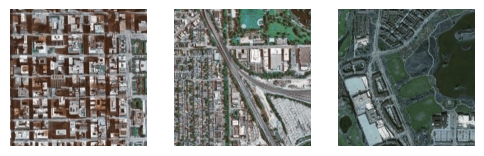

In [6]:
fig, ax = plt.subplots(1,3, figsize=(6,2))
ax[0].imshow(util_image.center_crop(cv2.imread(im1), (256,256)))
ax[1].imshow(util_image.center_crop(cv2.imread(im2), (256,256)))
ax[2].imshow(util_image.center_crop(cv2.imread(im3), (256,256)))
ax[0].axis("off")
ax[1].axis("off")
ax[2].axis("off")
plt.show()

In [6]:
def pre_process(img_name ,size=256):
    image = Image.open(img_name)
    if not image.mode == "RGB":
        image = image.convert("RGB")
    image = np.array(image).astype(np.uint8)
    image = (image.astype(np.float32) / 127.5) - 1.0

    s = int((600 - size) // 2)
    e = int((600 + size) // 2)
    image = image[s:e, s:e, :]
    
    return image

i1 = torch.tensor(pre_process(im1, size=img_size)[None,:,:,:]).permute(0, 3, 1, 2).to(memory_format=torch.contiguous_format).float().to(device)
i2 = torch.tensor(pre_process(im2, size=img_size)[None,:,:,:]).permute(0, 3, 1, 2).to(memory_format=torch.contiguous_format).float().to(device)
i3 = torch.tensor(pre_process(im3, size=img_size)[None,:,:,:]).permute(0, 3, 1, 2).to(memory_format=torch.contiguous_format).float().to(device)

enc1 = model.encode(i1).mode()#.reshape(1, -1)
enc2 = model.encode(i2).mode()#.reshape(1, -1)
enc3 = model.encode(i3).mode()#.reshape(1, -1)

### 0. Pixel-wise Interpolation

In [8]:
mult_list = np.arange(0,1.1,0.2)
mult_list


array([0. , 0.2, 0.4, 0.6, 0.8, 1. ])

In [9]:
image1 = cv2.imread(im1)/255
image2 = cv2.imread(im2)/255
image3 = cv2.imread(im3)/255

pixel_mix = []
for alpha in mult_list:
    img_row = []
    for beta in mult_list:
        im = image2 + alpha*(image3-image2) + beta*(image1-image2)
        im = util_image.center_crop(im, (224,224))
        img_row.append(np.clip(im,0,1))
    pixel_mix.append(img_row)

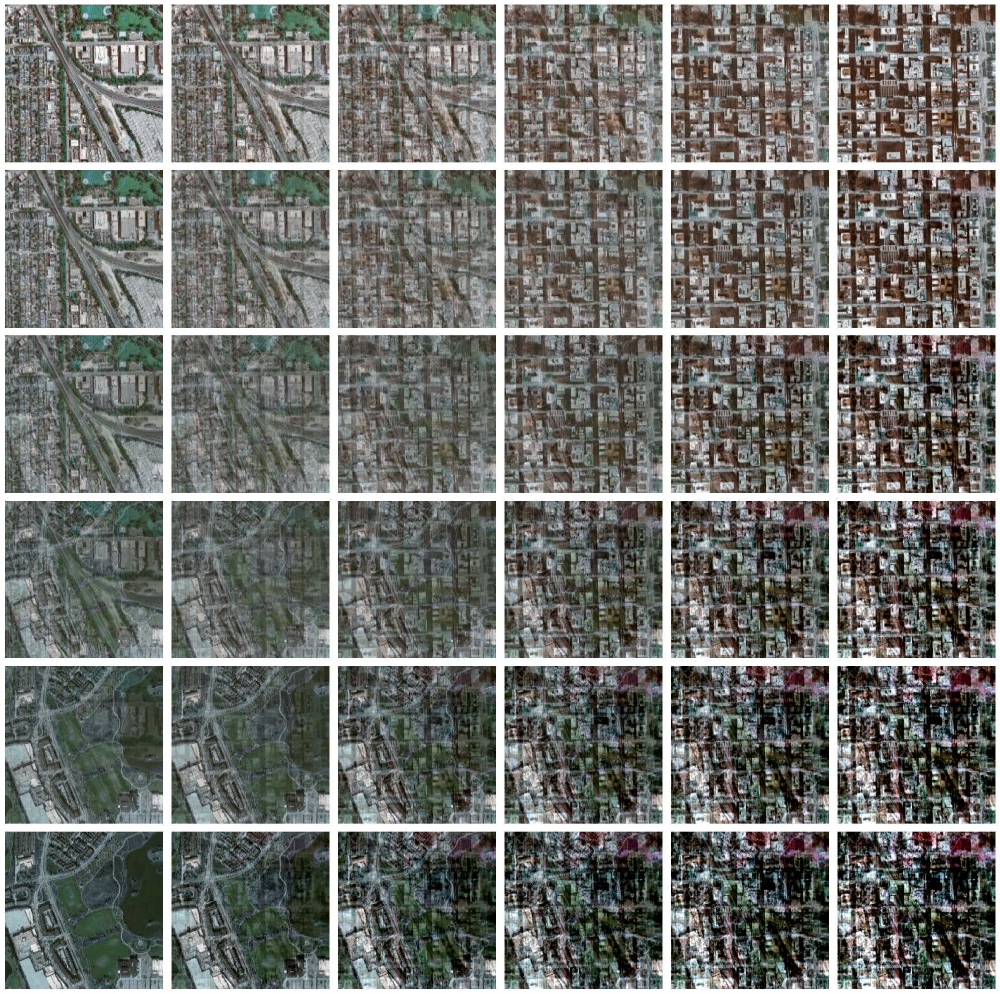

In [10]:
fig, ax = util_plot.plot_images(len(mult_list), len(mult_list), pixel_mix, mag=3)
plt.show()

### 1. Latent Space Dimension Reduction

In [11]:
# with open(proj_dir+"latent_space/"+version+"_sae_"+
#       str(config['model']['params']['ddconfig']['output_dim'])+"_"+
#       str(config['model']['params']['lossconfig']['params']['supervision_factor'])+
#       "_ep"+str(epoch)+".pkl", "rb") as f:

with open(proj_dir+"latent_space/"+version+"_sae_kl_f32_ep"+str(epoch)+".pkl", "rb") as f:

    encoder_output = pkl.load(f)
    im = pkl.load(f)
    ct = pkl.load(f)
    sup_true_list = pkl.load(f)
    sup_list = pkl.load(f)

In [22]:
unique_ct = list(set(ct))
unique_ct.sort()
ct = np.array(ct)
aggregate_embeddings = []
for i in unique_ct:
#     aggregate_embeddings.append(np.mean(sup_list[ct == i], axis=0))
    aggregate_embeddings.append(np.mean(encoder_output[ct == i], axis=0))
aggregate_embeddings = np.array(aggregate_embeddings)
aggregate_embeddings = aggregate_embeddings.reshape(aggregate_embeddings.shape[0], -1)

In [23]:
index1 = unique_ct.index(dt)
index2 = unique_ct.index(south)
index3 = unique_ct.index(north)

agg_enc1 = aggregate_embeddings[index1,:]
agg_enc2 = aggregate_embeddings[index2,:]
agg_enc3 = aggregate_embeddings[index3,:]

In [12]:
enc12 = []
enc13 = []
for alpha in np.linspace(0, 1, 20):
    enc12.append((1-alpha)*agg_enc1+alpha*agg_enc2)
    enc13.append((1-alpha)*agg_enc1+alpha*agg_enc3)

enc12 = np.vstack(enc12)
enc13 = np.vstack(enc13)

In [13]:
# tSNE
from sklearn import manifold
method = manifold.TSNE(n_components=2, init='pca', random_state=5)
# tsne_im = method.fit_transform(encoder_output)
# tsne_ct = method.fit_transform(np.concatenate([aggregate_embeddings, enc12, enc13], axis=0))
tsne_ct = method.fit_transform(aggregate_embeddings)

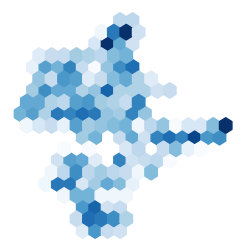

In [14]:
tsne_ct = pd.DataFrame(tsne_ct, columns = ['x0', 'x1'])
# density plot
fig, ax = plt.subplots(1,1,figsize=(3,3))
hexagons = ax.hexbin(tsne_ct["x0"].to_numpy(), tsne_ct["x1"].to_numpy(), gridsize=17, mincnt=1, cmap='Blues')
# sns.kdeplot(x=df_ct["x0"].to_numpy(), y=df_ct["x1"].to_numpy(), ax=ax, levels=7, color='royalblue')
ax.axis('off')
plt.show()

In [15]:
a = tsne_ct.to_numpy()

In [16]:
north_idx = unique_ct.index(north)

south_idx = unique_ct.index(south)

dt_idx = unique_ct.index(dt)

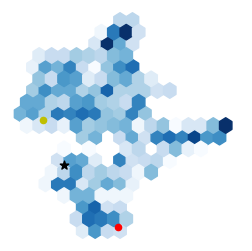

In [17]:
fig, ax = plt.subplots(1,1,figsize=(3,3))
hexagons = ax.hexbin(a[:,0], a[:,1], gridsize=17, mincnt=1, cmap='Blues')
# sns.kdeplot(x=a[:,0], y=a[:,1], ax=ax, levels=7, color='royalblue', alpha=0.5)
# ax.plot(tsne12[:,0], tsne12[:,1], c='r')
# ax.plot(tsne13[:,0], tsne13[:,1], c='g')
ax.scatter(a[north_idx,0], a[north_idx,1], c='y',s=20)
ax.scatter(a[dt_idx,0], a[dt_idx,1], c='r',s=20)
ax.scatter(a[south_idx,0], a[south_idx,1], marker='*', c='k',s=40)

plt.axis("off")
plt.show()

# fig.savefig(out_dir+"latent_space/SAE_"+zoomlevel+"_"+str(output_dim**2*2048)+"_"+
#                            v1+"_"+model_run_date+"_traj.png", bbox_inches='tight')

### 2. Image Complex

In [7]:
# individual highlights

alpha = 0.6
beta = 0.
enc = enc2 + alpha*(enc3-enc2) + beta*(enc1-enc2)
dec = model.decode(enc)
dec = dec.detach().cpu()

grid = torch.clamp(dec, -1,1)
grid = torchvision.utils.make_grid(grid, nrow=6, padding=10, pad_value=1)
grid = (grid + 1.0) / 2.0  # -1,1 -> 0,1; c,h,w
grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)
grid = grid.numpy()
grid = (grid * 255).astype(np.uint8)

Image.fromarray(grid).save(out_dir+"Figures/image_interpolation_alpha"+str(alpha)+"_beta"+str(beta)+".png")

In [8]:
mult_list = np.arange(0,1.1,0.2)

mult_list

array([0. , 0.2, 0.4, 0.6, 0.8, 1. ])

In [9]:
from models.mnl import MNL
model_mnl = MNL(n_alts=4, n_features=4096)
saved = torch.load(out_dir+"mnl_models/SAE+(4096)_0.7_1_1e-05_100000.pt")

model_mnl.load_state_dict(saved);
model_mnl.to(torch.device(device))

# torch.softmax(model_mnl(torch.tensor(aggregate_embeddings).to(device)), dim=1).mean(dim=0)

MNL(
  (beta): Linear(in_features=4096, out_features=4, bias=True)
)

In [10]:
dec_imgs = []
demos = []
logsums = []
auto_ = []
pt_ = []
active_ = []
grid = []

for alpha in mult_list:
    row = []
    logsum_row = []
    auto_row = []
    pt_row = []
    active_row = []
    
    for beta in mult_list:
        enc = enc2 + alpha*(enc3-enc2) + beta*(enc1-enc2)
        dec = model.decode(enc)
        grid.append(dec.detach().cpu())

        util = model_mnl(enc.view(1, -1))
        util = util.cpu().detach().numpy()
        auto_row.append(np.exp(util)[0][1]/np.sum(np.exp(util)))
        pt_row.append(np.exp(util)[0][3]/np.sum(np.exp(util)))
        active_row.append(np.exp(util)[0][0]/np.sum(np.exp(util)))
        util = np.log(np.sum(np.exp(util)))
        logsum_row.append(util)
        
        dec_demo = model.supervisor(enc.view(1,-1))
        row.append(dec_demo.detach().cpu().numpy())
        
    demos.append(row)
    logsums.append(logsum_row)
    auto_.append(auto_row)
    pt_.append(pt_row)
    active_.append(active_row)
    
grid = torch.cat(grid, dim=0)
grid = torch.clamp(grid, -1,1)
grid = torchvision.utils.make_grid(grid, nrow=6, padding=10, pad_value=1)
grid = (grid + 1.0) / 2.0  # -1,1 -> 0,1; c,h,w
grid = grid.transpose(0, 1).transpose(1, 2).squeeze(-1)

demos = np.array(demos)

grid = grid.numpy()
grid = (grid * 255).astype(np.uint8)

In [17]:
Image.fromarray(grid).save(out_dir+"Figures/image_complex.png")

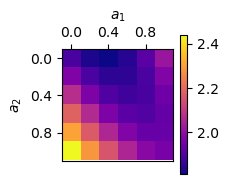

In [19]:
fig, ax = plt.subplots(1,1, figsize=(1.8,1.8))
plt.imshow(np.array(logsums),cmap="plasma")
ax.set_xticks(np.arange(0,len(mult_list),2))
ax.set_xticklabels(["{:.1f}".format(mult_list[a]) for a in np.arange(0,len(mult_list),2)])
ax.xaxis.set_ticks_position("top")
ax.xaxis.set_label_position("top")

ax.set_yticks(np.arange(0,len(mult_list),2))
ax.set_yticklabels(["{:.1f}".format(mult_list[a]) for a in np.arange(0,len(mult_list),2)])
ax.set_ylabel(r"$a_2$")
ax.set_xlabel(r"$a_1$")
plt.colorbar()
plt.show()
fig.savefig(out_dir+"Figures/welfare_complex_"+
                    image_name1+"_mix_"+image_name2+"_mix_"+image_name3+".png", 
                    bbox_inches='tight')

In [13]:
auto_

[[0.67377925, 0.5806984, 0.4801011, 0.37997612, 0.28830475, 0.21066535],
 [0.72763747, 0.64262617, 0.5460527, 0.44458863, 0.34654102, 0.2592832],
 [0.7750994, 0.69964534, 0.60995734, 0.51071376, 0.40942922, 0.31439686],
 [0.815942, 0.7506179, 0.6698175, 0.5760153, 0.47503874, 0.37498468],
 [0.85039705, 0.79502106, 0.7241628, 0.6382956, 0.541093, 0.43940198],
 [0.878999, 0.8328598, 0.7721429, 0.695778, 0.60527825, 0.50552535]]

In [14]:
pt_

[[0.10567528, 0.13911822, 0.17568871, 0.21239543, 0.2461604, 0.27474976],
 [0.085448146, 0.11527197, 0.14961581, 0.18607114, 0.22154047, 0.2531923],
 [0.06815173, 0.093966946, 0.1251337, 0.16004057, 0.19597882, 0.22987203],
 [0.053716857, 0.07548278, 0.102887645, 0.13515073, 0.17025156, 0.20528314],
 [0.041918416, 0.05986038, 0.083286546, 0.112134255, 0.14519973, 0.18010826],
 [0.032441694, 0.04695314, 0.06649181, 0.091520615, 0.121613264, 0.1551481]]

In [15]:
active_

[[0.16905281, 0.22541012, 0.2883193, 0.35303319, 0.41440898, 0.46847734],
 [0.1388257, 0.18968436, 0.24935937, 0.3140998, 0.37877575, 0.43845007],
 [0.11245079, 0.15703672, 0.21180728, 0.27437037, 0.34029582, 0.4042725],
 [0.09001495, 0.12811275, 0.17686759, 0.23531187, 0.30023208, 0.36665675],
 [0.07133903, 0.1031816, 0.1454046, 0.1982814, 0.26004598, 0.326707],
 [0.05607177, 0.0821951, 0.11789351, 0.1643543, 0.2211992, 0.28581798]]

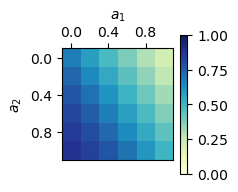

In [20]:
fig, ax = plt.subplots(1,1, figsize=(1.8,1.8))
plt.imshow(np.array(auto_),cmap="YlGnBu", vmin=0,vmax=1)
ax.set_xticks(np.arange(0,len(mult_list),2))
ax.set_xticklabels(["{:.1f}".format(mult_list[a]) for a in np.arange(0,len(mult_list),2)])
ax.xaxis.set_ticks_position("top")
ax.xaxis.set_label_position("top")
ax.set_yticks(np.arange(0,len(mult_list),2))
ax.set_yticklabels(["{:.1f}".format(mult_list[a]) for a in np.arange(0,len(mult_list),2)])
ax.set_ylabel(r"$a_2$")
ax.set_xlabel(r"$a_1$")
plt.colorbar()
plt.show()
fig.savefig(out_dir+"Figures/auto_complex_"+
                    image_name1+"_mix_"+image_name2+"_mix_"+image_name3+".png", 
                    bbox_inches='tight')

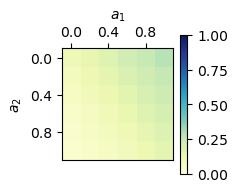

In [21]:
fig, ax = plt.subplots(1,1, figsize=(1.8,1.8))
plt.imshow(np.array(pt_),cmap="YlGnBu", vmin=0,vmax=1)
ax.set_xticks(np.arange(0,len(mult_list),2))
ax.set_xticklabels(["{:.1f}".format(mult_list[a]) for a in np.arange(0,len(mult_list),2)])
ax.xaxis.set_ticks_position("top")
ax.xaxis.set_label_position("top")
ax.set_yticks(np.arange(0,len(mult_list),2))
ax.set_yticklabels(["{:.1f}".format(mult_list[a]) for a in np.arange(0,len(mult_list),2)])
ax.set_ylabel(r"$a_2$")
ax.set_xlabel(r"$a_1$")
plt.colorbar()
plt.show()
fig.savefig(out_dir+"Figures/pt_complex_"+
                    image_name1+"_mix_"+image_name2+"_mix_"+image_name3+".png", 
                    bbox_inches='tight')

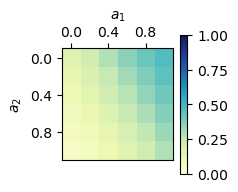

In [22]:
fig, ax = plt.subplots(1,1, figsize=(1.8,1.8))
plt.imshow(np.array(active_),cmap="YlGnBu", vmin=0,vmax=1)
ax.set_xticks(np.arange(0,len(mult_list),2))
ax.set_xticklabels(["{:.1f}".format(mult_list[a]) for a in np.arange(0,len(mult_list),2)])
ax.xaxis.set_ticks_position("top")
ax.xaxis.set_label_position("top")
ax.set_yticks(np.arange(0,len(mult_list),2))
ax.set_yticklabels(["{:.1f}".format(mult_list[a]) for a in np.arange(0,len(mult_list),2)])
ax.set_ylabel(r"$a_2$")
ax.set_xlabel(r"$a_1$")
plt.colorbar()
plt.show()
fig.savefig(out_dir+"Figures/active_complex_"+
                    image_name1+"_mix_"+image_name2+"_mix_"+image_name3+".png", 
                    bbox_inches='tight')

## 3. Latent Space Directional Move

In [26]:
Image.fromarray(grid[:256,:,:]).save(out_dir+"Figures/image_interpolation.png")

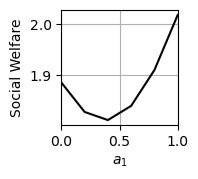

In [23]:
fig, ax = plt.subplots(1,1, figsize=(1.5,1.5))
ax.plot(mult_list, logsums[0], color='k')
ax.set_ylabel("Social Welfare")
ax.set_xlabel(r'$a_1$')
# ax.legend()
ax.set_xlim([0,1])
ax.set_xticks(np.arange(0,1.1,0.5))
ylim = ax.get_ylim()
# ax.plot([1,1], ylim, '--', color='k',)

ax.set_ylim(ylim)
ax.grid()
plt.show()
fig.savefig(out_dir+"Figures/welfare_"+
                    image_name1+"_mix_"+image_name2+".png", 
                    bbox_inches='tight')

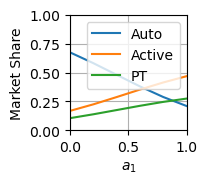

In [24]:
fig, ax = plt.subplots(1,1, figsize=(1.5,1.5))
ax.plot(mult_list, [auto_[0][i] for i in range(len(auto_))], label='Auto')
ax.plot(mult_list, [active_[0][i] for i in range(len(auto_))], label='Active')
ax.plot(mult_list, [pt_[0][i] for i in range(len(auto_))], label='PT')
ax.set_ylabel("Market Share")
ax.set_xlabel(r'$a_1$')
ax.legend()

ax.set_xlim([0,1])
ax.set_xticks(np.arange(0,1.1,0.5))
ylim = [0,1]
# ax.plot([1,1], ylim, '--', color='k',)
ax.set_ylim([0,1])
ax.grid()
plt.show()
fig.savefig(out_dir+"Figures/market_"+
                    image_name1+"_mix_"+image_name2+".png", 
                    bbox_inches='tight')

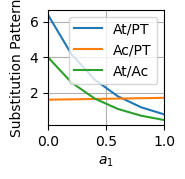

In [25]:
fig, ax = plt.subplots(1,1, figsize=(1.5,1.5))
ax.plot(mult_list, [auto_[0][i]/pt_[0][i] for i in range(len(auto_))], label='At/PT')
ax.plot(mult_list, [active_[0][i]/pt_[0][i] for i in range(len(auto_))], label='Ac/PT')
ax.plot(mult_list, [auto_[0][i]/active_[0][i] for i in range(len(auto_))], label='At/Ac')
ax.set_ylabel("Substitution Pattern")
ax.set_xlabel(r'$a_1$')
ax.legend()
ax.set_xticks(np.arange(0,1.1,0.5))
ax.set_xlim([0,1])
ylim = ax.get_ylim()
# ax.plot([1,1], ylim, '--', color='k',)

ax.set_ylim(ylim)
ax.grid()
plt.show()
fig.savefig(out_dir+"Figures/substitution_"+
                    image_name1+"_mix_"+image_name2+".png", 
                    bbox_inches='tight')

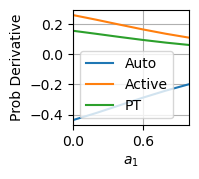

In [26]:
u = torch.flatten((enc1-enc2)[0])

fig, ax = plt.subplots(1,1, figsize=(1.5,1.5))

for k,n in zip([1,0,3], ['Auto','Active','PT']):
    pd = []
    for alpha in mult_list:
        prob_derivative = 0

        enc = enc2 + alpha*(enc3-enc2)

        util = model_mnl(enc.view(1, -1))
        prob = torch.softmax(util, dim=1)

        for j in range(4):
            if j == k:
                prob_derivative += model_mnl.beta.weight[k,:] * prob[0,k] * (1-prob[0,k])
            else:
                prob_derivative -= model_mnl.beta.weight[j,:] * prob[0,k] * prob[0,j]

        pd.append(torch.dot(prob_derivative, u).detach().cpu().numpy())
    
    ax.plot(mult_list, pd, label = n)

ylim = ax.get_ylim()
# ax.plot([1,1], ylim, '--', color='k',)
ax.set_ylabel("Prob Derivative")
ax.set_xlabel(r'$a_1$')
ax.legend()
ax.set_xticks(np.arange(0,1.1,0.6))
ax.set_xlim([0,1])
ax.set_ylim(ylim)
ax.grid()
plt.show()
fig.savefig(out_dir+"Figures/probdev_"+
                    image_name1+"_mix_"+image_name2+".png", 
                    bbox_inches='tight')

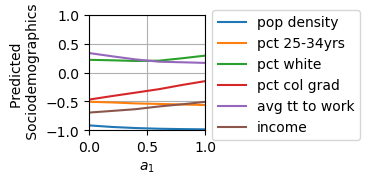

In [13]:
demos = np.squeeze(np.array(demos))
# demos_norm = (demos-demos.min(axis=0))/(demos.max(axis=0)-demos.min(axis=0))
# demos_norm = demos_norm.T

demo_variables = ['pop density','pct 25-34yrs','pct35_50yrs','pctover65yrs',
         'pct white', 'pct non-white',
         'pct black',
         'pct col grad','avg tt to work','income']

fig, ax = plt.subplots(figsize=(1.5,1.5))
# im = ax.imshow(demos[0,:].T, cmap='YlGnBu')
for i in [0,1,4,7,8,9]:
# for i in range(10):
    ax.plot(mult_list, demos[:,0,i], label=demo_variables[i])
    
ax.set_xticks(np.arange(0,1.1,0.5))
ax.set_xlabel(r'$a_1$')
ax.set_xlim([0,1])

# ax.plot([1,1], ylim, '--', color='k',)

ax.set_ylim([-1,1])
ax.grid()
ax.legend(bbox_to_anchor=(1,1.1));
ax.set_ylabel("Predicted \n Sociodemographics")
fig.savefig(out_dir+"Figures/social_"+
                    image_name1+"_mix_"+image_name2+".png", 
                    bbox_inches='tight')